# Eploratory Data Analysis

This notebook is adapted from: 
* https://www.kaggle.com/code/jeffaudi/eda-airbus-oil-storage-tanks-dataset

In [2]:
%%capture
import os
from ast import literal_eval

import pandas as pd
import PIL.ImageDraw
import seaborn as sns
from IPython.display import display
from matplotlib import pyplot as plt

# disable tensorflow logging 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

# load kedro variables 
%load_ext kedro.extras.extensions.ipython

# read data 
annotations = catalog.load("annotations")

In [5]:
# show the number of objects per image
with sns.axes_style("whitegrid"):
    plt.figure(figsize=(25, 15))
    plt.title("Number of Oil Storage Tanks per image", fontsize=25)
    g = sns.countplot(
        x="image_id",
        data=annotations.merge(
            pd.DataFrame(annotations.image_id.value_counts())
            .reset_index(drop=False)
            .rename(columns={"index": "image_id", "image_id": "object_count"})
        )
        .sort_values(by="object_count")
        .reset_index(drop=True),
        palette="bright"
    )
    plt.xlabel("image_id", fontsize=20)
    plt.ylabel("n row per image_id", fontsize=20)

    # Rotate x labels
    g.set_xticklabels(labels=g.get_xticklabels(), rotation=90, size=9)  


    os.makedirs("../data/08_reporting/plots", exist_ok=True)
    plt.close() # remove if plot should be shown inline
    plt.savefig("../data/08_reporting/plots/number_objects_per_image.png", transparent=True)

<Figure size 432x288 with 0 Axes>

In [6]:
# convert bounds to python object
annotations["bounds"] = annotations["bounds"].apply(
    lambda x: literal_eval(str(x).rstrip("\r\n"))
)

# Create polygon from bounds
def create_polygon_from_bounds(bbox):
    (xmin, ymin, xmax, ymax) = bbox
    coords = []
    coords.append((xmin, ymin))
    coords.append((xmin, ymax))
    coords.append((xmax, ymax))
    coords.append((xmax, ymin))
    coords.append((xmin, ymin))
    return coords


def draw_bboxes(image_id: str, labels: pd.DataFrame) -> None:
    """Draws rectangular boundings boxes on a given image.

    Args:
        image (PIL.Image): Image to draw boxes on. 
        labels (pd.DataFrame): Labels dataframe containing the geometries

    Returns:
        None: None.
    """
    img= PIL.Image.open("../data/01_raw" + "/images/" + image_id + ".jpg")
    draw = PIL.ImageDraw.Draw(img)
    for _, row in labels[labels["image_id"] == image_id].iterrows():
        geometry = create_polygon_from_bounds(row['bounds'])
        draw.polygon(
            geometry, outline=(255, 0, 0),
        )
    return img

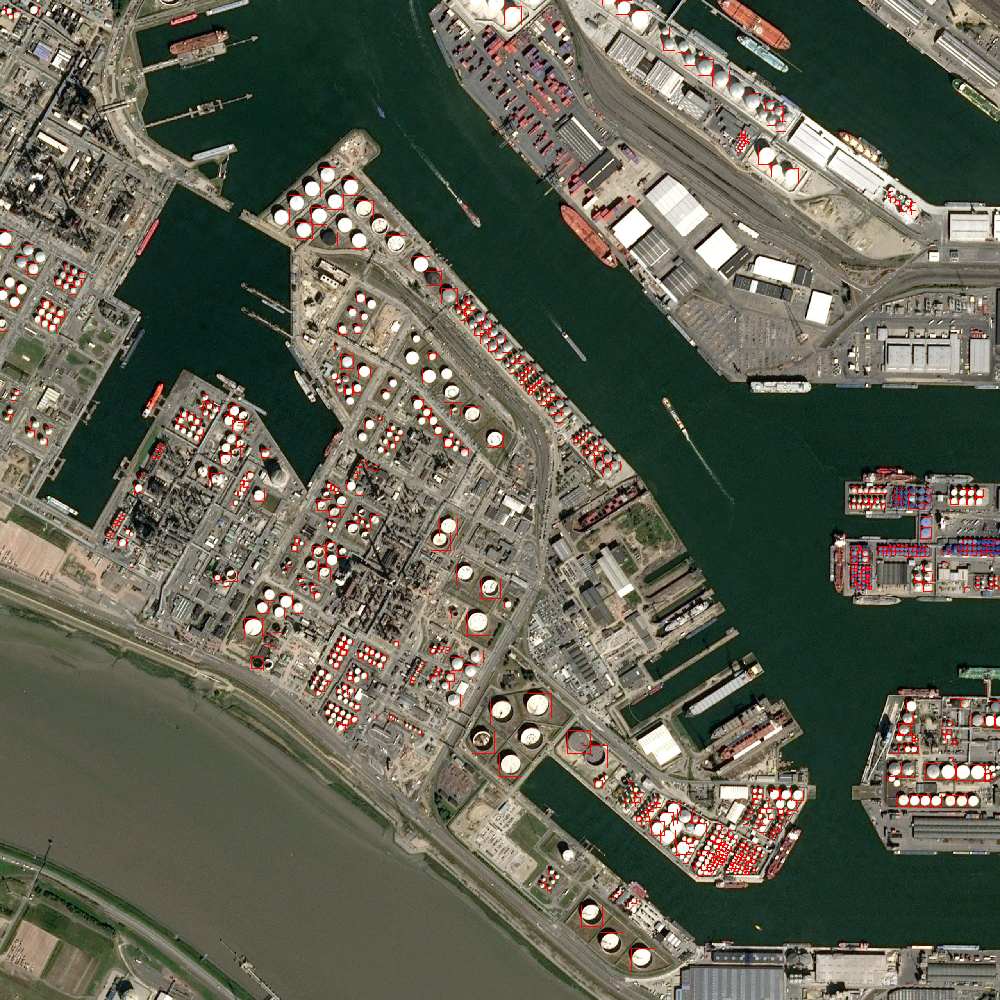

In [7]:
img = draw_bboxes("1fcb9fee-da89-43f8-83d9-b5d17575f5e6", annotations)
display(img)